# AC analysis

<img src="AC_schematic.png" width ="400" height=400>

### Goals 
- Compute the voltage $\hat{V}_{out}$ in the bandwidth from 1kHz to 500MHz.
- Compute the volatge $v_{out}(t)$ at the steady state for an excitation $v_{in}(t)=5cos(2\pi 100\times 10^3 t)$
- Compute the volatge $v_{out}(t)$ at the steady state for an excitation $v_{in}(t)=5cos(2\pi 10\times 10^6 t)$


## LTspice netlist and Python
**(file "AC.cir")**

```
* AC analysis -  SPICE

V1 1 0 AC 1
L 1 2 159u
C 2 3 1.6p
R1 3 0 100

.AC dec 1K 1K 500Meg

.print V(3)
.end
```


In [1]:
import os
import ltspice
import matplotlib.pyplot as plt
import numpy as np
import math

#%matplotlib inline

import mpld3
mpld3.enable_notebook()

import warnings
warnings.filterwarnings("ignore")


#Run the simulation and save in binary .raw
os.system('/Applications/LTspice.app/Contents/MacOS/LTspice -b AC.cir')

0

In [2]:
#read the raw file generated by LTspice

filepath = 'AC.raw'


l = ltspice.Ltspice(filepath)
l.parse() # Data loading sequence. It may take few minutes for huge file.

print(l.variables)

['frequency', 'V(3)']


In [3]:
var = l.variables

freq = l.get_frequency()

Vout = l.getData(var[1])

Vout[1]

(1.0153226011457526e-12+1.0076271373976307e-06j)

Text(0.5, 1.0, 'Linear scale')

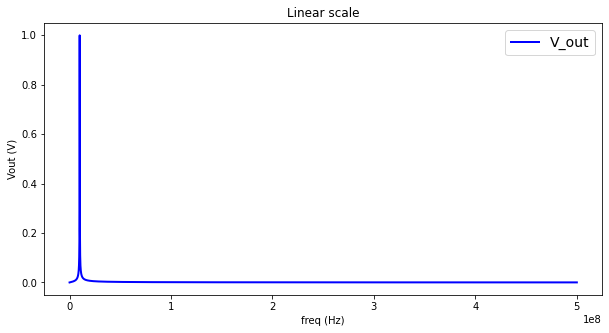

In [4]:
# Plots
#linear scale
plt.figure(figsize=(10, 5))

plt.plot(freq,abs(Vout),color='blue',lw=2,label='V_out')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('freq (Hz)')
plt.ylabel('Vout (V)')
plt.title('Linear scale')

Text(0.5, 1.0, 'Linear scale')

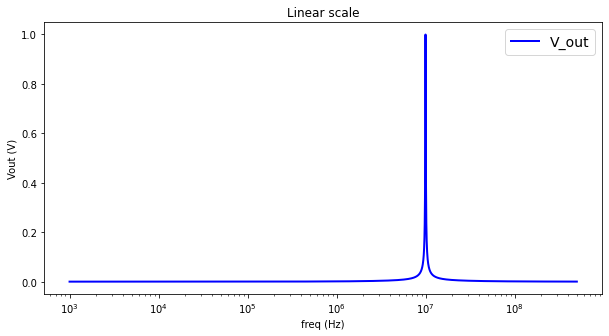

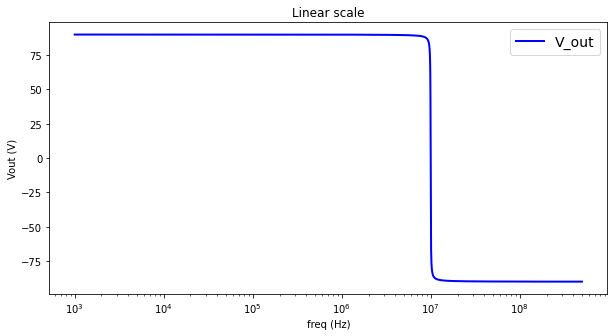

In [5]:
# Plot log-scale
plt.figure(figsize=(10, 5))

plt.semilogx(freq,abs(Vout),color='blue',lw=2,label='V_out')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('freq (Hz)')
plt.ylabel('Vout (V)')
plt.title('Linear scale')

plt.figure(figsize=(10, 5))

plt.semilogx(freq,np.angle(Vout)*180/np.pi,color='blue',lw=2,label='V_out')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('freq (Hz)')
plt.ylabel('Vout (V)')
plt.title('Linear scale')

#plt.savefig('test_noise_level_v1.pdf')

## From AC to steady-state responses

Known the trasnfer funcion:

$$H(j\omega)=\hat{V}_{out}(j\omega)/\hat{V}_{in}(j\omega)$$, 

the state-state response of the circuit to any sinusoidal excitation, such as $v_{in}(t)=A cos(\omega_0t+\phi)$ writes:

$$v_{out}(t)=A\cdot |H(j\omega_0)|\cdot cos(\omega_0 t+\phi+\text{phase}\{H(j\omega_0)\})$$


Text(0.5, 1.0, 'Bode plot PHASE')

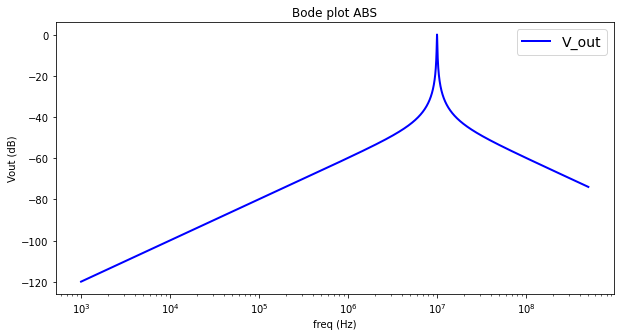

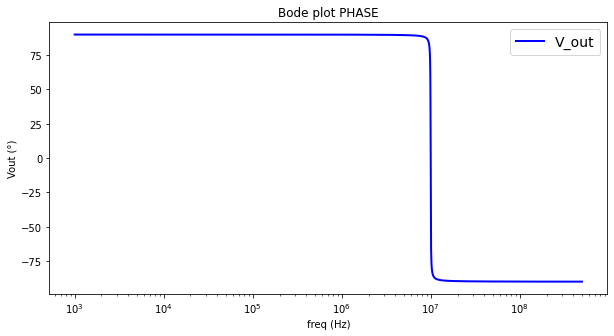

In [6]:
# Bode plot

Vout_dB = 20*np.log10(abs(Vout))

plt.figure(figsize=(10, 5))

plt.semilogx(freq,Vout_dB,color='blue',lw=2,label='V_out')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('freq (Hz)')
plt.ylabel('Vout (dB)')
plt.title('Bode plot ABS')

plt.figure(figsize=(10, 5))

plt.semilogx(freq,np.angle(Vout)*180/np.pi,color='blue',lw=2,label='V_out')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('freq (Hz)')
plt.ylabel('Vout (°)')
plt.title('Bode plot PHASE')

In [7]:
# Steady-state solutions

from scipy.interpolate import interp1d

time = np.linspace(0,0.1e-3,10000)

H_abs_int = interp1d(freq, abs(Vout))
H_phase_int = interp1d(freq,np.angle(Vout))

# f0 = 100kHz
A = 5 
f_100k = 100e3

phi_in = -np.pi/2

vout_100k = A*abs(H_abs_int(f_100k))*np.cos(2*np.pi*f_100k*time+phi_in+H_phase_int(f_100k))

# f0 = 10MHz
A = 5 
f_10M = 10e6

phi_in = -np.pi/2

vout_10M = A*abs(H_abs_int(f_10M))*np.cos(2*np.pi*f_10M*time+phi_in+H_phase_int(f_10M))

Text(0, 0.5, 'vout (V)')

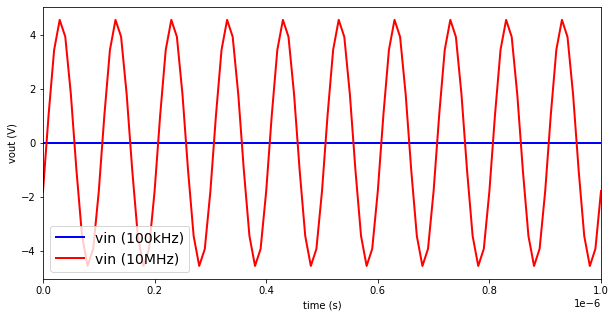

In [8]:
#PLOT
plt.figure(figsize=(10, 5))

plt.plot(time,vout_100k,color='blue',lw=2,label='vin (100kHz)')
plt.plot(time,vout_10M,color='red',lw=2,label='vin (10MHz)')
plt.xlim((0,1e-6)) 

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('time (s)')
plt.ylabel('vout (V)')
#plt.title('')
#plt.savefig('test_noise_level_v1.pdf')

In [9]:
# 100kHz

#Run the simulation and save in binary .raw
os.system('/Applications/LTspice.app/Contents/MacOS/LTspice -b tran_100k.cir')


#read the raw file generated by LTspice

filepath = 'tran_100k.raw'


l = ltspice.Ltspice(filepath)
l.parse() # Data loading sequence. It may take few minutes for huge file.

time_100k_SPICE = l.get_time()

vout_100k_SPICE = l.getData(var[1])

# 10MHz

#Run the simulation and save in binary .raw
os.system('/Applications/LTspice.app/Contents/MacOS/LTspice -b tran_10M.cir')


#read the raw file generated by LTspice

filepath = 'tran_10M.raw'


l = ltspice.Ltspice(filepath)
l.parse() # Data loading sequence. It may take few minutes for huge file.

time_10M_SPICE = l.get_time()

vout_10M_SPICE = l.getData(var[1])

print(l.variables)


['time', 'V(3)']


(4.8e-05, 5e-05)

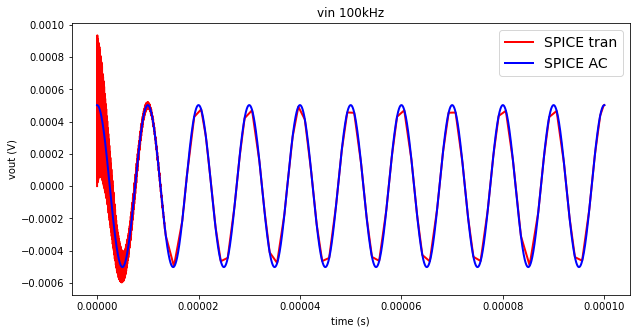

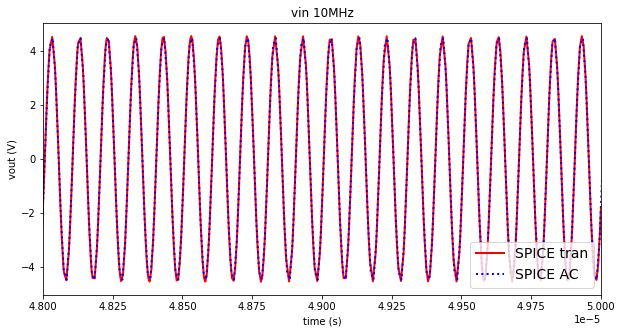

In [10]:
plt.figure(figsize=(10, 5))

plt.plot(time_100k_SPICE,vout_100k_SPICE,color='red',lw=2,label='SPICE tran')
plt.plot(time,vout_100k,color='blue',lw=2,label='SPICE AC')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('time (s)')
plt.ylabel('vout (V)')
plt.title('vin 100kHz')
#plt.savefig('test_noise_level_v1.pdf')



plt.figure(figsize=(10, 5))
plt.plot(time_10M_SPICE,vout_10M_SPICE,color='red',lw=2,label='SPICE tran')
plt.plot(time,vout_10M,'b:',lw=2,label='SPICE AC')

plt.legend(loc="best",  scatterpoints=1, prop={'size': 14})
plt.xlabel('time (s)')
plt.ylabel('vout (V)')
plt.title('vin 10MHz')

plt.xlim((48e-6,50e-6)) 